In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import requests
from bs4 import BeautifulSoup
from PIL import Image
from PIL import ImageOps
from colormap import rgb2hex
import cv2
from scipy import cluster
from sklearn.preprocessing import MinMaxScaler
import imagesize
import random
from sklearn.preprocessing import LabelEncoder
from ipywidgets import interact
import time
from io import BytesIO
from keras.applications.vgg16 import VGG16
from keras.layers import Input
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer
from keras.utils import load_img, img_to_array
from tqdm.notebook import tqdm

2022-12-06 10:25:52.581768: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
pd.set_option('display.max_columns', None)

# Load raw data

In [3]:
PATH = 'Data/DeepFashion_attributes - train/img/'

In [4]:
cat_names = pd.read_csv('Data/DeepFashion_attributes - train/list_category.txt',sep ='\s+',header=None).reset_index().rename(columns={0:'category',1:'section','index':'cat_num'})



In [5]:
cat_names['cat_num'] = cat_names['cat_num'].apply(lambda x : x+1)

In [6]:
cat_names.head()

,cat_num,category,section
0,1,Anorak,1
1,2,Blazer,1
2,3,Blouse,1
3,4,Bomber,1
4,5,Button-Down,1


In [7]:
cat_tag = pd.read_csv('Data/DeepFashion_attributes - train/tag_cat_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'cat_num'})



In [8]:
cat_img = pd.read_csv('Data/DeepFashion_attributes - train/img_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'img'})

In [9]:
cat_num = cat_img.join(cat_tag).drop(columns='img')


In [10]:
cat_num.head()

,cat_num
0,3
1,33
2,41
3,26
4,2


In [11]:
cat = cat_num.merge(cat_names, on='cat_num', how='left').drop(columns='cat_num')



In [12]:
cat

,category,section
0,Blouse,1
1,Skirt,2
2,Dress,3
3,Jeans,2
4,Blazer,1
...,...,...
19995,Tank,1
19996,Sweater,1
19997,Henley,1
19998,Jumpsuit,3


In [13]:
cat['section'] = cat['section'].map({1:'upper',2:'lower',3:'full body'})

In [14]:
cat_names = pd.read_csv('Data/DeepFashion_attributes - train/list_category.txt',sep ='\s+',header=None).reset_index().rename(columns={0:'category',1:'section','index':'cat_num'})



In [15]:
cat_names['cat_num'] = cat_names['cat_num'].apply(lambda x : x+1)

In [16]:
cat_names.head()

,cat_num,category,section
0,1,Anorak,1
1,2,Blazer,1
2,3,Blouse,1
3,4,Bomber,1
4,5,Button-Down,1


In [17]:
cat_tag = pd.read_csv('Data/DeepFashion_attributes - train/tag_cat_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'cat_num'})



In [18]:
cat_img = pd.read_csv('Data/DeepFashion_attributes - train/img_simple.txt',sep='\s+',header=None,names=['category']).rename(columns={'category':'img'})

In [19]:
cat_num = cat_img.join(cat_tag)


In [20]:
cat_num.head()

,img,cat_num
0,img/Sweet_Crochet_Blouse/img_00000070.jpg,3
1,img/Classic_Pencil_Skirt/img_00000010.jpg,33
2,img/Strapless_Diamond_Print_Dress/img_00000038...,41
3,img/Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_0000...,26
4,img/Zippered_Single-Button_Blazer/img_00000078...,2


In [21]:
cat = cat_num.merge(cat_names, on='cat_num', how='left').drop(columns='cat_num')


In [22]:
cat['img'] = cat['img'].apply(lambda x: x[4:])

In [23]:
cat

,img,category,section
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,1
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,2
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,3
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,2
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,1
...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,1
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,1
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,1
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,3


In [24]:
cat['section'] = cat['section'].map({1:'upper',2:'lower',3:'full body'})

In [25]:
attr_names = pd.read_csv('Data/DeepFashion_attributes - train/list_attr_simple.txt',sep='\s+', header=None).rename(columns={0:'attribute',1:'attribute type'})


In [26]:
attr_names

,attribute,attribute type
0,floral,1
1,graphic,1
2,striped,1
3,embroidered,1
4,pleated,1
5,solid,1
6,lattice,1
7,long_sleeve,2
8,short_sleeve,2
9,sleeveless,2


In [27]:
attr_names['attribute type'] = attr_names['attribute type'].map({1:'design',2:'sleeves',3:'length',4:'part',5:'fabric',6:'fit'})


In [28]:
attr_names_headers = attr_names.iloc[:,0]
attr_names_headers

0              floral
1             graphic
2             striped
3         embroidered
4             pleated
5               solid
6             lattice
7         long_sleeve
8        short_sleeve
9          sleeveless
10        maxi_length
11        mini_length
12           no_dress
13      crew_neckline
14         v_neckline
15    square_neckline
16        no_neckline
17              denim
18            chiffon
19             cotton
20            leather
21               faux
22               knit
23              tight
24              loose
25       conventional
Name: attribute, dtype: object

In [29]:
attr_tags = pd.read_csv('Data/DeepFashion_attributes - train/tags_attr_simple.txt',sep='\s+',header=None,names=attr_names_headers)


In [30]:
attr_tags

,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional
0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
19996,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
19997,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1
19998,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1


In [31]:
attr_img = pd.read_csv('Data/DeepFashion_attributes - train/img_simple.txt',sep='\s+',header=None).rename(columns={0:'img'})



In [32]:
attr_img

,img
0,img/Sweet_Crochet_Blouse/img_00000070.jpg
1,img/Classic_Pencil_Skirt/img_00000010.jpg
2,img/Strapless_Diamond_Print_Dress/img_00000038...
3,img/Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_0000...
4,img/Zippered_Single-Button_Blazer/img_00000078...
...,...
19995,img/Embroidered_Peasant_Tank/img_00000044.jpg
19996,img/Tasmanian_Devil_Sweater/img_00000048.jpg
19997,img/Lace-Sleeved_Raglan_Henley/img_00000022.jpg
19998,img/Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg


In [33]:
attr = attr_img.join(attr_tags,how='inner').drop(columns='img')

In [34]:
attr

,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional
0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1
19996,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
19997,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1
19998,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1


In [35]:
bb = pd.read_csv('Data/DeepFashion_attributes - train/bbox.txt',sep='\s+',header=None,index_col=False, names=['img','x_1', 'y_1', 'x_2', 'y_2'])


In [36]:
bb['img'] = bb['img'].apply(lambda x: x[4:])

In [37]:
landmarks = pd.read_csv('Data/DeepFashion_attributes - train/landmarks.txt',sep='\s+',names=['img','clothes_type','v1','x1','y1','v2','x2','y2','v3','x3','y3','v4','x4','y4','v5','x5','y5','v6','x6','y6','v7','x7','y7','v8','x8','y8']).fillna(0).drop(columns=['clothes_type'])



In [38]:
landmarks['img'] = landmarks['img'].apply(lambda x: x[4:])

In [39]:
data_full = cat.join(attr,how='left').merge(bb,how='left',on='img').merge(landmarks, how='left',on='img')



# Filter attributes

In [40]:
data_full

,img,category,section,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional,x_1,y_1,x_2,y_2,v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4,v5,x5,y5,v6,x6,y6,v7,x7,y7,v8,x8,y8
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,66,75,241,293,0,120,104,0,181,109,0,104,93,0,196,95,0.0,90.0,273.0,0.0,212.0,267.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,lower,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,65,88,132,218,1,75,103,1,121,99,0,74,206,0,118,206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,full body,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,75,43,176,300,0,104,64,0,132,64,0,98,71,0,140,68,0.0,100.0,99.0,0.0,138.0,102.0,0.0,89.0,276.0,0.0,159.0,277.0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,lower,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,64,1,129,273,1,73,13,0,116,5,0,89,237,0,118,246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,12,257,300,0,105,37,0,149,36,0,30,280,0,224,280,0.0,74.0,281.0,0.0,186.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,93,53,160,136,0,112,62,0,140,62,0,102,60,0,147,67,0.0,102.0,128.0,0.0,149.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,38,74,196,261,0,80,99,0,136,89,0,60,239,0,170,244,0.0,83.0,232.0,0.0,140.0,228.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,upper,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,99,51,136,172,0,111,61,1,130,62,0,111,144,0,129,153,0.0,104.0,156.0,1.0,124.0,161.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,full body,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,57,36,158,268,0,91,56,1,123,55,0,71,83,0,141,84,0.0,88.0,105.0,0.0,124.0,106.0,0.0,96.0,247.0,0.0,114.0,244.0


In [41]:
# If item is sleevless and of lower type, set attribute value to 0:
data_full['sleeveless'] = data_full.apply(lambda x: 0 if ((x['sleeveless'])==1) & (x['section']=='lower') else x['sleeveless'], axis =1)


In [42]:
data_full

,img,category,section,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,no_dress,crew_neckline,v_neckline,square_neckline,no_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional,x_1,y_1,x_2,y_2,v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4,v5,x5,y5,v6,x6,y6,v7,x7,y7,v8,x8,y8
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,66,75,241,293,0,120,104,0,181,109,0,104,93,0,196,95,0.0,90.0,273.0,0.0,212.0,267.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,lower,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,65,88,132,218,1,75,103,1,121,99,0,74,206,0,118,206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,full body,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,75,43,176,300,0,104,64,0,132,64,0,98,71,0,140,68,0.0,100.0,99.0,0.0,138.0,102.0,0.0,89.0,276.0,0.0,159.0,277.0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,lower,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,64,1,129,273,1,73,13,0,116,5,0,89,237,0,118,246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,12,257,300,0,105,37,0,149,36,0,30,280,0,224,280,0.0,74.0,281.0,0.0,186.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,upper,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,93,53,160,136,0,112,62,0,140,62,0,102,60,0,147,67,0.0,102.0,128.0,0.0,149.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,upper,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,38,74,196,261,0,80,99,0,136,89,0,60,239,0,170,244,0.0,83.0,232.0,0.0,140.0,228.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,upper,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,99,51,136,172,0,111,61,1,130,62,0,111,144,0,129,153,0.0,104.0,156.0,1.0,124.0,161.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,full body,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,57,36,158,268,0,91,56,1,123,55,0,71,83,0,141,84,0.0,88.0,105.0,0.0,124.0,106.0,0.0,96.0,247.0,0.0,114.0,244.0


In [43]:
data_full.drop(columns=['no_dress','no_neckline'],inplace=True)

# Crop and augment images

In [44]:
data_full

,img,category,section,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,crew_neckline,v_neckline,square_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional,x_1,y_1,x_2,y_2,v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4,v5,x5,y5,v6,x6,y6,v7,x7,y7,v8,x8,y8
0,Sweet_Crochet_Blouse/img_00000070.jpg,Blouse,upper,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,66,75,241,293,0,120,104,0,181,109,0,104,93,0,196,95,0.0,90.0,273.0,0.0,212.0,267.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Classic_Pencil_Skirt/img_00000010.jpg,Skirt,lower,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,65,88,132,218,1,75,103,1,121,99,0,74,206,0,118,206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Strapless_Diamond_Print_Dress/img_00000038.jpg,Dress,full body,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,75,43,176,300,0,104,64,0,132,64,0,98,71,0,140,68,0.0,100.0,99.0,0.0,138.0,102.0,0.0,89.0,276.0,0.0,159.0,277.0
3,Mid-Rise_-_Acid_Wash_Skinny_Jeans/img_00000010...,Jeans,lower,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,64,1,129,273,1,73,13,0,116,5,0,89,237,0,118,246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Zippered_Single-Button_Blazer/img_00000078.jpg,Blazer,upper,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,12,257,300,0,105,37,0,149,36,0,30,280,0,224,280,0.0,74.0,281.0,0.0,186.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Embroidered_Peasant_Tank/img_00000044.jpg,Tank,upper,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,93,53,160,136,0,112,62,0,140,62,0,102,60,0,147,67,0.0,102.0,128.0,0.0,149.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,Tasmanian_Devil_Sweater/img_00000048.jpg,Sweater,upper,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,38,74,196,261,0,80,99,0,136,89,0,60,239,0,170,244,0.0,83.0,232.0,0.0,140.0,228.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,Lace-Sleeved_Raglan_Henley/img_00000022.jpg,Henley,upper,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,99,51,136,172,0,111,61,1,130,62,0,111,144,0,129,153,0.0,104.0,156.0,1.0,124.0,161.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,Floral_Mosaic_Print_Jumpsuit/img_00000017.jpg,Jumpsuit,full body,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,57,36,158,268,0,91,56,1,123,55,0,71,83,0,141,84,0.0,88.0,105.0,0.0,124.0,106.0,0.0,96.0,247.0,0.0,114.0,244.0


In [45]:
data_full_attr = data_full.iloc[:,3:-28]

In [46]:
data_full_attr

,floral,graphic,striped,embroidered,pleated,solid,lattice,long_sleeve,short_sleeve,sleeveless,maxi_length,mini_length,crew_neckline,v_neckline,square_neckline,denim,chiffon,cotton,leather,faux,knit,tight,loose,conventional
0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1
19996,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1
19997,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1
19998,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1


In [47]:
attribute_count = data_full_attr.apply(pd.value_counts)

In [48]:
attribute_count_T = attribute_count.T.reset_index().rename(columns={'index':'attribute'})

In [49]:
attribute_count_T

,attribute,0,1
0,floral,16598,3402
1,graphic,16654,3346
2,striped,18653,1347
3,embroidered,18333,1667
4,pleated,19586,414
5,solid,10518,9482
6,lattice,19658,342
7,long_sleeve,13883,6117
8,short_sleeve,16526,3474
9,sleeveless,13365,6635


In [50]:
attribute_count_type = attribute_count_T.merge(attr_names, on='attribute')

In [51]:
attribute_count_type

,attribute,0,1,attribute type
0,floral,16598,3402,design
1,graphic,16654,3346,design
2,striped,18653,1347,design
3,embroidered,18333,1667,design
4,pleated,19586,414,design
5,solid,10518,9482,design
6,lattice,19658,342,design
7,long_sleeve,13883,6117,sleeves
8,short_sleeve,16526,3474,sleeves
9,sleeveless,13365,6635,sleeves


In [52]:
attribute_count_type_mean = attribute_count_type.groupby('attribute type').median().drop(columns=0)

In [53]:
attribute_count_type_mean

,1
attribute type,
design,1667.0
fabric,1458.0
fit,2891.0
length,2931.5
part,3458.0
sleeves,6117.0


In [54]:
attribute_count_mean = attribute_count_type[1].median()
attribute_count_mean

2888.0

In [55]:
attr_names_list = attribute_count_type['attribute'].values
attr_names_list

array(['floral', 'graphic', 'striped', 'embroidered', 'pleated', 'solid',
       'lattice', 'long_sleeve', 'short_sleeve', 'sleeveless',
       'maxi_length', 'mini_length', 'crew_neckline', 'v_neckline',
       'square_neckline', 'denim', 'chiffon', 'cotton', 'leather', 'faux',
       'knit', 'tight', 'loose', 'conventional'], dtype=object)

In [56]:
def landmark_crop(index): # NOT USED AT THE MOMENT !
    observation = data_full.iloc[index,:] # get observation from database according to index
    v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4=observation[-24:-12] # landmarks belonging to ALL images
    lm_x = [x1,x2,x3,x4]
    lm_y = [y1,y2,y3,y4]
    lm_v = [v1,v2,v3,v4]
    
    section = data_full.iloc[index,2] # get section type for image
    if section == 'upper' or section == 'full body': # if image is an upper or full body, has 6 landmarks
        v5,x5,y5,v6,x6,y6=observation[-12:-6]
        lm_x.extend([x5,x6])
        lm_y.extend([y5,y6])
        lm_v.extend([v5,v6])
    if section == 'full body': # if image is full body has 8 landmarks
        v7,x7,y7,v8,x8,y8=observation[-6:]
        lm_x.extend([x7,x8])
        lm_y.extend([y7,y8])
        lm_v.extend([v7,v8])
    
    lm_x = np.array(lm_x)
    lm_y = np.array(lm_y)
    lm_x = lm_x[lm_x !=0] # keep only non-zero landmarks 
    lm_y = lm_y[lm_y !=0]
    
    pts = (np.array(list(zip(lm_x,lm_y)))).astype('int') # store coordinates defined by landmarks
    
    img_name = observation[0]
    full_path = PATH+img_name
    
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert image to correct format
    
    x,y,w,h = cv2.boundingRect(pts) # create approximate rectangle using landmark points
    cropped = Image.fromarray(img[y:y+h, x:x+w].copy()) # crop image by bounding rectangle

    return cropped
    

In [57]:
def format_image(index): # format image
    observation = data_full.iloc[index,:] # get observation from database according to index    
    img_name = observation[0]
    full_path = PATH+img_name
    
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # CROP IMAGES:
    plt.imshow(img)
    box_x1,box_y1,box_x2,box_y2 = (np.array(observation[-28:-24].values)) # box coords
    cropped = Image.fromarray(img[box_y1:box_y2, box_x1:box_x2].copy()) # crop image using box

    # PAD IMAGES:
    cropped_pad = ImageOps.pad(cropped,(256,256),color=(255, 255, 255)) # pad image to (256,256) with white background
    plt.imshow(cropped_pad)
    
    # AUGMENT IMAGES:
#     # Create an ImageDataGenerator object with the desired transformations
#     datagen = ImageDataGenerator(
#         rotation_range=40,
#         zoom_range=0.2,
#         horizontal_flip=True
#     )
#     # Load the original image
#     image = im_pad
#     # Convert the image to a Numpy array
#     x = img_to_array(image)
#     # Reshape the array to include an extra dimension for the number of images
#     x = x.reshape((1,) + x.shape)
#     # Generate the augmented images and save them
#     i = 0
#     for batch in datagen.flow(x, batch_size=1, save_to_dir=PATH, save_format='jpg'):
#         i += 1
#         if i >= 10:
#             break
    return cropped_pad


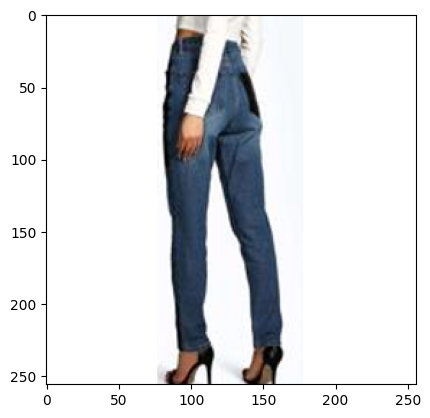

In [58]:
sample_index = np.random.randint(20000)
image = format_image(sample_index)

plt.imshow(image)

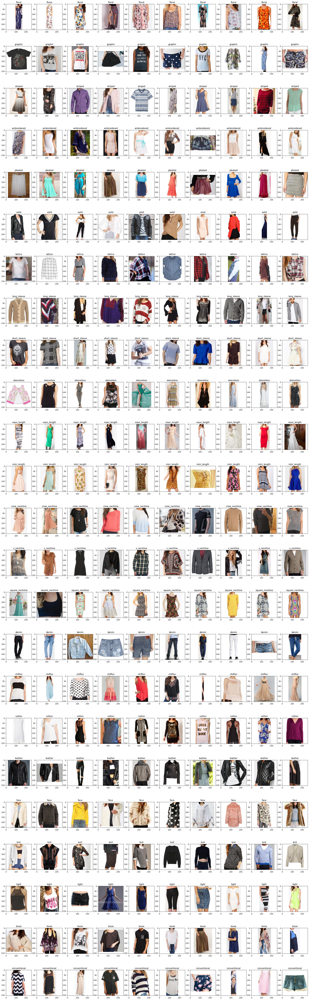

In [59]:
fig, axs = plt.subplots(24,10,figsize=(30,100))
for i in range(24):
    for j in range(10):
        index = data_full[data_full[attr_names_list[i]]==1].sample(1).index._data[0]
        img = format_image(index)
        img = axs[i][j].imshow(img)
        axs[i][j].title.set_text(attr_names_list[i])

In [60]:
def landmark_crop(index): # NOT USED AT THE MOMENT !
    observation = data_full.iloc[index,:] # get observation from database according to index
    v1,x1,y1,v2,x2,y2,v3,x3,y3,v4,x4,y4=observation[-24:-12] # landmarks belonging to ALL images
    lm_x = [x1,x2,x3,x4]
    lm_y = [y1,y2,y3,y4]
    lm_v = [v1,v2,v3,v4]
    
    section = data_full.iloc[index,2] # get section type for image
    if section == 'upper' or section == 'full body': # if image is an upper or full body, has 6 landmarks
        v5,x5,y5,v6,x6,y6=observation[-12:-6]
        lm_x.extend([x5,x6])
        lm_y.extend([y5,y6])
        lm_v.extend([v5,v6])
    if section == 'full body': # if image is full body has 8 landmarks
        v7,x7,y7,v8,x8,y8=observation[-6:]
        lm_x.extend([x7,x8])
        lm_y.extend([y7,y8])
        lm_v.extend([v7,v8])
    
    lm_x = np.array(lm_x)
    lm_y = np.array(lm_y)
    lm_x = lm_x[lm_x !=0] # keep only non-zero landmarks 
    lm_y = lm_y[lm_y !=0]
    
    pts = (np.array(list(zip(lm_x,lm_y)))).astype('int') # store coordinates defined by landmarks
    
    img_name = observation[0]
    full_path = PATH+img_name
    
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert image to correct format
    
    x,y,w,h = cv2.boundingRect(pts) # create approximate rectangle using landmark points
    cropped = Image.fromarray(img[y:y+h, x:x+w].copy()) # crop image by bounding rectangle

    return cropped
    

# Attribute model testing 

In [61]:
def format_image(img_name,box_x1,box_y1,box_x2,box_y2): # format image
    full_path = PATH+img_name
    
    # LOAD IMAGES:
    img = cv2.imread(full_path) # open image using OpenCV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # CROP IMAGES:
    cropped = Image.fromarray(img[box_y1:box_y2, box_x1:box_x2].copy()) # crop image using box
    
    # PAD IMAGES:
    cropped_pad = ImageOps.pad(cropped,(256,256),color=(255)) # pad image to (256,256) with white background
    
    cropped_pad_array = img_to_array(cropped_pad)
    
    return cropped_pad_array

## Without image augmentation

### Fit

In [75]:
#Train-test-split

from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

fit_data = data_full.iloc[:,np.r_[0,24:27]]

In [76]:
X = fit_data['img']
y = fit_data.drop(columns='img')

In [77]:
from tqdm import tqdm_notebook
from keras.utils import load_img

In [73]:
X = np.array([format_image(X[0], *X[1:]) for X_name in tqdm(X)])

  0%|          | 0/20000 [00:00<?, ?it/s]

TypeError: format_image() takes 5 positional arguments but 20000 were given

In [74]:
fit_X.shape

(20000,)

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=2, test_size=0.2)

KeyboardInterrupt: 

In [ ]:
fabric_X_train, fabric_X_val, fabric_y_train, fabric_y_val = train_test_split(fabric_X_train, fabric_y_train, test_size =0.2,random_state=2)



KeyboardInterrupt



In [ ]:
fabric_X_train

13855                             Utility_Romper/img_00000050.jpg
10567           Pintucked_Crochet-Paneled_Blouse/img_00000017.jpg
8573                         Lace_Trimmed_Blouse/img_00000037.jpg
19782                  Mesh_Overlay_Sheath_Dress/img_00000037.jpg
13586    Fringed_Southwestern-Embroidered_Kimono/img_00000012.jpg
                                   ...                           
14402                Textured_Diamond_Knit_Dress/img_00000049.jpg
12692             Embroidered_Cutout_Smock_Dress/img_00000049.jpg
418                 Crisscross-Back_Skater_Dress/img_00000030.jpg
1939                      Kaleidoscope_Woven_Tee/img_00000020.jpg
3639                Two-Button_Chino_Suit_Jacket/img_00000062.jpg
Name: img, Length: 12800, dtype: object

#### VGG16

In [ ]:
# Training image size --> (256,256,3)

In [ ]:
fabric_input = Input(shape=(640, 480, 3))
model = VGG16(include_top=False, input_tensor=new_input)

NameError: name 'Input' is not defined